In [177]:
import numpy as np
import pandas as pd

reviews_df = pd.read_csv('./datasets/reviews_translated.csv')
reviews_df

,Unnamed: 0,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,I received it well before the stipulated time.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Congratulations Lannister stores I loved shopp...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...,...
99219,99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excellent backpack, super fast delivery. I hig...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


In [178]:
orders_df = pd.read_csv('./datasets/olist_orders_dataset.csv')

# keep only customer_id and order_id
orders_df = orders_df[['customer_id', 'order_id']]

orders_df

,customer_id,order_id
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7
1,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451
2,41ce2a54c0b03bf3443c3d931a367089,47770eb9100c2d0c44946d9cf07ec65d
3,f88197465ea7920adcdbec7375364d82,949d5b44dbf5de918fe9c16f97b45f8a
4,8ab97904e6daea8866dbdbc4fb7aad2c,ad21c59c0840e6cb83a9ceb5573f8159
...,...,...
99436,39bd1228ee8140590ac3aca26f2dfe00,9c5dedf39a927c1b2549525ed64a053c
99437,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8
99438,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab
99439,b331b74b18dc79bcdf6532d51e1637c1,11c177c8e97725db2631073c19f07b62


In [179]:
emoji_2_vec_df = pd.read_csv('./datasets/emoji2vec.txt', sep=' ', header=None, skiprows=1)

# drop the last column
emoji_2_vec_df.drop(301, axis=1, inplace=True)
emoji_2_vec_df

,0,1,2,3,4,5,6,7,8,9,...,291,292,293,294,295,296,297,298,299,300
0,👔,-0.948672,-1.366934,0.471430,0.033376,-0.204312,-1.361626,1.170855,-1.402970,1.440986,...,-0.373400,1.108675,-0.933760,1.406928,1.600049,-0.365838,1.194540,-0.731762,-1.074095,1.380831
1,🌀,0.950610,0.501679,-2.435349,-0.978138,-0.529112,0.130621,-1.320763,-2.370538,0.627210,...,1.078202,1.420525,-1.304538,-0.981743,1.810987,0.019831,-0.155767,1.806277,1.311635,1.863038
2,🚾,-1.471456,2.126487,0.404308,-0.045077,-0.786014,1.035192,-0.364169,-2.399548,2.620733,...,-1.684766,-0.115742,-1.672504,0.084682,-2.302870,-2.009828,-0.771870,0.093430,1.396214,1.229043
3,👹,2.174815,0.194892,1.293836,0.764526,-2.608198,1.495713,0.725468,0.130371,2.050876,...,-1.590500,1.089331,-1.314696,2.130610,-0.685074,-0.456439,0.639508,0.786081,-0.260375,1.618681
4,🚻,0.666353,0.874635,-0.395491,0.263260,-1.331070,0.535882,-0.479108,-0.738322,2.402728,...,-0.179974,0.544557,0.115022,0.076561,-0.923281,-0.869922,-0.023010,-1.244231,0.177369,-1.256237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1655,☸,0.073877,0.017161,-0.040788,0.066763,-0.094839,-0.018545,0.078263,-0.052765,-0.065722,...,0.014828,0.022541,-0.072241,-0.078592,0.040896,0.026690,0.063746,0.044376,0.021888,-0.015541
1656,↩️,-0.090396,-0.080296,-0.085784,0.034896,-0.049530,-0.034356,0.014771,0.002262,-0.014445,...,0.033449,0.065256,0.051934,0.009407,-0.058448,0.092182,-0.046094,-0.023261,0.000759,-0.033531
1657,☦,-0.048389,0.047149,-0.088375,0.039720,-0.002185,-0.048643,0.083287,-0.035496,-0.078040,...,0.087571,-0.076134,-0.082288,-0.084250,0.032959,0.075081,0.081334,0.092410,-0.065435,-0.026170
1658,👩‍👩‍👧‍👦,-0.085716,-0.097576,-0.025435,0.038997,-0.030377,0.059459,-0.040233,-0.080535,-0.009823,...,-0.011516,-0.025640,0.045969,0.079389,0.056463,0.085289,-0.084805,-0.077745,-0.031235,0.006387


In [180]:
# number of reviews that are NaN
reviews_df.isna().sum()

Unnamed: 0                     0
review_id                      0
order_id                       0
review_score                   0
review_comment_title       87660
review_comment_message     58275
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [181]:
# number of reviews that have a title but no review
reviews_df[reviews_df['review_comment_message'].isna() & reviews_df['review_comment_title'].notna()].shape

print("There are {} reviews that have a title but no review".format(reviews_df[reviews_df['review_comment_message'].isna() & reviews_df['review_comment_title'].notna()].shape[0]))

There are 1737 reviews that have a title but no review


In [182]:
# # reviews that either have a title or a review
# reviews_with_title_or_review = reviews_df[reviews_df['review_comment_message'].notna() | reviews_df['review_comment_title'].notna()]
# reviews_with_title_or_review

In [183]:
# percentage of reviews that have a title or a review out of all reviews
print("Percentage of reviews that have a title or a review out of all reviews: {:.2f}%".format(reviews_with_title_or_review.shape[0] / reviews_df.shape[0] * 100))

Percentage of reviews that have a title or a review out of all reviews: 43.02%


In [184]:
# remove rows that don't have a review
reviews_df.dropna(subset=['review_comment_message'], inplace=True)

# drop review comment title
reviews_df.drop('review_comment_title', axis=1, inplace=True)

In [185]:
# inner join orders_df and reviews_with_title_or_review
orders_with_review = pd.merge(orders_df, reviews_df, on='order_id', how='inner', validate='one_to_many')
orders_with_review

,customer_id,order_id,Unnamed: 0,review_id,review_score,review_comment_message,review_creation_date,review_answer_timestamp
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,32790,a54f0611adc9ed256b57ede6b6eb5114,4,"I haven't tested the product yet, but it came ...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451,29158,8d5266042046a06655c8db133d120ba5,4,The product is very good.,2018-08-08 00:00:00,2018-08-08 18:37:50
2,f88197465ea7920adcdbec7375364d82,949d5b44dbf5de918fe9c16f97b45f8a,77520,359d03e676b3c069f62cadba8dd3f6e8,5,The product was exactly what I expected and wa...,2017-12-03 00:00:00,2017-12-05 19:21:58
3,ed0271e0b7da060a393796590e7b737a,136cce7faa42fdb2cefd53fdc79a6098,28656,e07549ef5311abcc92ba1784b093fb56,2,I was sad that he didn't answer me.,2017-05-13 00:00:00,2017-05-13 20:25:42
4,494dded5b201313c64ed7f100595b95c,e6ce16cb79ec1d90b1da9085a6118aeb,49954,15898b543726a832d4137fbef5d1d00e,1,Waiting for return from the store,2017-05-30 00:00:00,2017-05-30 23:13:47
...,...,...,...,...,...,...,...,...
40944,8e1ec396e317ff4c82a03ce16a0c3eb3,b0f4af5c1b06e24fef510703bfe9f0a6,10208,ede62474f1618961be12678f362dca4a,5,Great to buy on this site the goods arrive bef...,2017-11-11 00:00:00,2017-11-15 09:54:14
40945,a2f7428f0cafbc8e59f20e1444b67315,cfa78b997e329a5295b4ee6972c02979,15586,8ea780895f362ce949029f95b7181ff0,1,"It is not a mini cajon, it is a shaker, that i...",2018-01-19 00:00:00,2018-01-21 02:51:39
40946,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8,55670,29bb71b2760d0f876dfa178a76bc4734,4,Just a piece that came cracked but that's ok lol,2018-03-01 00:00:00,2018-03-02 17:50:01
40947,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab,43847,371579771219f6db2d830d50805977bb,5,It was delivered before the deadline.,2017-09-22 00:00:00,2017-09-22 23:10:57


In [186]:
transformer_to_use = 'all-roberta-large-v1'

In [187]:
# # remove rows that don't have a review
# reviews_df.dropna(subset=['review_comment_message'], inplace=True)

# # drop review comment title
# reviews_df.drop('review_comment_title', axis=1, inplace=True)

In [188]:
# orders_with_review['review_comment_message'] = orders_with_review['review_comment_message'].fillna(orders_with_review['review_comment_title'])

In [189]:
def resultant_average(vector1, vector2):
    """Computes the resultant average of two vectors.

    Args:
        vector1 (numpy.ndarray): The first vector.
        vector2 (numpy.ndarray): The second vector.

    Returns:
        numpy.ndarray: The resultant average of the two vectors.
    """
    
    if vector1 is None:
        return vector2
    
    if vector2 is None:
        return vector1
    
    if vector1.shape != vector2.shape:
        raise ValueError('The two vectors must have the same shape.')
    
    return (vector1 + vector2) / 2

In [190]:
# test_df_similar_to_orders_with_review = pd.DataFrame(columns=['customer_id', 'order_id', 'review_comment_message', 'review_comment_title', 'similarity_score'])

# # insert a row into test_df_similar_to_orders_with_review
# test_df_similar_to_orders_with_review.loc[0] = [orders_with_review['customer_id'][0], orders_with_review['order_id'][0], orders_with_review['review_comment_message'][0], orders_with_review['review_comment_title'][0], 0.0]

# new_val = "I haven't tested the product yet 100, but it came correct 😁😁😁 and in good condition 👌. Only the 😘 box that came well crumpled and damaged, which will be annoying as it is a gift."

# test_df_similar_to_orders_with_review.loc[0] = [orders_with_review['customer_id'][0], orders_with_review['order_id'][0], new_val, orders_with_review['review_comment_title'][0], 0.0]

# test_df_similar_to_orders_with_review

In [191]:
# test_df_similar_to_orders_with_review['review_comment_message'][0]

In [192]:
def remove_emoji(text):
    """Removes emojis from text.

    Args:
        text (str): The text to remove emojis from.

    Returns:
        str: The text with emojis removed.
    """
    
    return text.encode('ascii', 'ignore').decode('ascii')

In [193]:
# orders_with_review = orders_with_review.iloc[:10]

In [194]:
from transformers import MPNetModel, MPNetTokenizer
from spellchecker import SpellChecker
import torch
import string
import pandas as pd
import numpy as np

# Load the MPNet model and tokenizer
model = MPNetModel.from_pretrained("microsoft/mpnet-base")
tokenizer = MPNetTokenizer.from_pretrained("microsoft/mpnet-base")

# Initialize the spell checker
spell = SpellChecker()

all_embeddings = pd.DataFrame()
for index, row in orders_with_review.iterrows():
    
    print("Processing row {}".format(index))
    
    # encode the review_comment_message. If review_comment_message is NaN, encode the review_comment_title
    to_be_encoded = row['review_comment_message'] if not pd.isna(row['review_comment_message']) else row['review_comment_title']
    
    ########### Handling emojis ###########
    
    emoji_embeddings = None
    
    # check for any emoji in the review. If there is, select all distinct emojis and encode them using emoji2vec
    if any(char in emoji_2_vec_df[0].values for char in to_be_encoded):
        emojis = set([char for char in to_be_encoded if char in emoji_2_vec_df[0].values])
        # encode each emoji using emoji2vec and get the resultant average of all the encoded emojis
        encoded_emojis = np.array([])
        emoji_1_vec = None
        emoji_2_vec = None
        for emoji in emojis:
            
            emoji_2_vec = emoji_2_vec_df[emoji_2_vec_df[0] == emoji].values[0][1:]
            emoji_1_vec = resultant_average(emoji_1_vec, emoji_2_vec)
            encoded_emojis = emoji_1_vec
        
        emoji_embeddings = pd.DataFrame(encoded_emojis).T
        
    ########### Handling text #############
    to_be_encoded = remove_emoji(to_be_encoded)
    
    # Correct misspelled words
    words = to_be_encoded.split()
    corrected_words = [spell.correction(word) if word.isalpha() else word for word in words]
    corrected_words = [word if word is not None else '' for word in corrected_words]
    to_be_encoded = " ".join(corrected_words)
    
    # encode the text
    inputs = tokenizer(to_be_encoded, return_tensors='pt')
    outputs = model(**inputs)
    text_embeddings = outputs.last_hidden_state.mean(dim=1).detach().numpy()
    text_embeddings = pd.DataFrame(text_embeddings).T
    
    # concatenate the emoji embeddings and text embeddings along the columns
    
    if emoji_embeddings is None:
        emoji_embeddings = pd.DataFrame(np.zeros((1, 300)))
    
    ## NOTE: Rejected emoji embeddings
    embeddings = text_embeddings
    
    all_embeddings = pd.concat([all_embeddings, embeddings.T], axis=0)

Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.bias', 'mpnet.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing row 0
Processing row 1
Processing row 2
Processing row 3
Processing row 4
Processing row 5
Processing row 6
Processing row 7
Processing row 8
Processing row 9
Processing row 10
Processing row 11
Processing row 12
Processing row 13
Processing row 14
Processing row 15
Processing row 16
Processing row 17
Processing row 18
Processing row 19
Processing row 20
Processing row 21
Processing row 22
Processing row 23
Processing row 24
Processing row 25
Processing row 26
Processing row 27
Processing row 28
Processing row 29
Processing row 30
Processing row 31
Processing row 32
Processing row 33
Processing row 34
Processing row 35
Processing row 36
Processing row 37
Processing row 38
Processing row 39
Processing row 40
Processing row 41
Processing row 42
Processing row 43
Processing row 44
Processing row 45
Processing row 46
Processing row 47
Processing row 48
Processing row 49
Processing row 50
Processing row 51
Processing row 52
Processing row 53
Processing row 54
Processing row 55
Pr

In [195]:
# from transformers import MPNetModel, MPNetTokenizer
# from spellchecker import SpellChecker
# import torch
# import string
# import pandas as pd
# import numpy as np

# # Load the MPNet model and tokenizer
# model = MPNetModel.from_pretrained("microsoft/mpnet-base")
# tokenizer = MPNetTokenizer.from_pretrained("microsoft/mpnet-base")

# # Initialize the spell checker
# spell = SpellChecker()

# all_embeddings = pd.DataFrame()
# for index, row in orders_with_review.iterrows():
    
#     print("Processing row {}".format(index))
    
#     # encode the review_comment_message. If review_comment_message is NaN, encode the review_comment_title
#     to_be_encoded = row['review_comment_message'] if not pd.isna(row['review_comment_message']) else row['review_comment_title']
    
#     ########### Handling emojis ###########
    
#     emoji_embeddings = None
    
#     # check for any emoji in the review. If there is, select all distinct emojis and encode them using emoji2vec
#     if any(char in emoji_2_vec_df[0].values for char in to_be_encoded):
#         emojis = set([char for char in to_be_encoded if char in emoji_2_vec_df[0].values])
#         # encode each emoji using emoji2vec and get the resultant average of all the encoded emojis
#         encoded_emojis = np.array([])
#         emoji_1_vec = None
#         emoji_2_vec = None
#         for emoji in emojis:
            
#             emoji_2_vec = emoji_2_vec_df[emoji_2_vec_df[0] == emoji].values[0][1:]
#             emoji_1_vec = resultant_average(emoji_1_vec, emoji_2_vec)
#             encoded_emojis = emoji_1_vec
        
#         emoji_embeddings = pd.DataFrame(encoded_emojis).T
        
#     ########### Handling text #############
#     to_be_encoded = remove_emoji(to_be_encoded)
    
#     # Correct misspelled words
#     words = to_be_encoded.split()
#     corrected_words = [spell.correction(word) if word.isalpha() else word for word in words]
#     corrected_words = [word if word is not None else '' for word in corrected_words]
#     to_be_encoded = " ".join(corrected_words)
    
#     # encode the text
#     inputs = tokenizer(to_be_encoded, return_tensors='pt')
#     outputs = model(**inputs)
#     text_embeddings = outputs.last_hidden_state.mean(dim=1).detach().numpy()
#     text_embeddings = pd.DataFrame(text_embeddings).T
    
#     # concatenate the emoji embeddings and text embeddings along the columns
    
#     if emoji_embeddings is None:
#         emoji_embeddings = pd.DataFrame(np.zeros((1, 300)))
    
#     ## NOTE: Rejected emoji embeddings
#     embeddings = text_embeddings
    
#     all_embeddings = pd.concat([all_embeddings, embeddings.T], axis=0)

In [196]:
# standardize the embeddings
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
all_embeddings = scaler.fit_transform(all_embeddings)

all_embeddings = pd.DataFrame(all_embeddings)
all_embeddings

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.655973,-1.228812,0.863883,-0.170002,-0.066623,0.494675,0.539964,0.051406,0.117261,-0.438080,...,0.020146,-0.660193,-0.514803,-0.145651,0.306152,-0.021416,-0.682256,-1.142961,0.676626,0.321577
1,2.836589,0.138897,0.679352,-0.415388,-1.100607,0.105044,1.271916,0.139412,-1.118307,0.552487,...,-1.430315,0.907319,0.058991,-0.984407,0.975018,-0.230738,-0.130082,0.079854,0.172168,-1.146498
2,0.584310,-0.612947,-0.254303,-0.603113,-1.212825,0.068243,0.193569,0.222521,-0.150480,-0.389496,...,0.102140,0.282453,-0.321565,0.645362,0.317188,1.043302,-0.650781,-1.136785,0.508800,-0.182869
3,-1.077934,0.557371,0.720255,0.112092,0.018250,-0.737786,1.237551,-0.335245,0.371480,0.122083,...,0.912369,0.714659,-0.058675,-1.424428,0.873128,0.039510,0.444394,0.571169,0.535965,1.067822
4,-0.082607,0.952183,-1.580443,0.928957,0.671453,2.867751,-0.690321,-0.859661,-0.688129,0.157279,...,1.695780,-0.685602,-1.139788,0.329754,-1.632741,0.849852,-0.978935,0.009196,-1.534939,-0.677127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,0.742471,0.301731,-1.072989,-0.095132,1.345510,0.922879,-0.136508,0.218195,0.678668,-0.366751,...,1.902926,-1.457229,-0.226344,0.063256,-2.834475,0.431362,-1.266078,-0.143776,0.259660,-1.099528
40945,0.358479,-1.049723,1.793246,0.105492,-1.506161,0.735354,1.571214,-0.935602,1.356426,1.380343,...,0.566147,0.681736,-0.482506,-0.815522,0.779929,0.169117,-0.363426,0.826187,-0.194349,-0.716559
40946,0.776081,-0.895481,0.334971,1.626749,0.204929,1.174383,1.850955,-0.036399,0.802951,0.994315,...,-0.110215,-1.491605,1.212588,0.731724,0.680768,0.408800,-0.211591,0.732654,0.790530,-0.638645
40947,0.206526,0.870812,0.240702,0.296532,-0.547745,0.492109,0.038351,0.061513,-0.574432,-0.071900,...,0.346253,-0.207310,-0.169397,0.640382,0.231146,0.742466,0.379581,-1.023129,-1.040537,-1.117418


In [197]:
# merge all_embeddings with orders_with_review
all_embeddings.reset_index(drop=True, inplace=True)
orders_with_review.reset_index(drop=True, inplace=True)
all_embeddings = pd.concat([orders_with_review, all_embeddings], axis=1)
all_embeddings

,customer_id,order_id,Unnamed: 0,review_id,review_score,review_comment_message,review_creation_date,review_answer_timestamp,0,1,...,758,759,760,761,762,763,764,765,766,767
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,32790,a54f0611adc9ed256b57ede6b6eb5114,4,"I haven't tested the product yet, but it came ...",2017-10-11 00:00:00,2017-10-12 03:43:48,0.655973,-1.228812,...,0.020146,-0.660193,-0.514803,-0.145651,0.306152,-0.021416,-0.682256,-1.142961,0.676626,0.321577
1,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451,29158,8d5266042046a06655c8db133d120ba5,4,The product is very good.,2018-08-08 00:00:00,2018-08-08 18:37:50,2.836589,0.138897,...,-1.430315,0.907319,0.058991,-0.984407,0.975018,-0.230738,-0.130082,0.079854,0.172168,-1.146498
2,f88197465ea7920adcdbec7375364d82,949d5b44dbf5de918fe9c16f97b45f8a,77520,359d03e676b3c069f62cadba8dd3f6e8,5,The product was exactly what I expected and wa...,2017-12-03 00:00:00,2017-12-05 19:21:58,0.584310,-0.612947,...,0.102140,0.282453,-0.321565,0.645362,0.317188,1.043302,-0.650781,-1.136785,0.508800,-0.182869
3,ed0271e0b7da060a393796590e7b737a,136cce7faa42fdb2cefd53fdc79a6098,28656,e07549ef5311abcc92ba1784b093fb56,2,I was sad that he didn't answer me.,2017-05-13 00:00:00,2017-05-13 20:25:42,-1.077934,0.557371,...,0.912369,0.714659,-0.058675,-1.424428,0.873128,0.039510,0.444394,0.571169,0.535965,1.067822
4,494dded5b201313c64ed7f100595b95c,e6ce16cb79ec1d90b1da9085a6118aeb,49954,15898b543726a832d4137fbef5d1d00e,1,Waiting for return from the store,2017-05-30 00:00:00,2017-05-30 23:13:47,-0.082607,0.952183,...,1.695780,-0.685602,-1.139788,0.329754,-1.632741,0.849852,-0.978935,0.009196,-1.534939,-0.677127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,8e1ec396e317ff4c82a03ce16a0c3eb3,b0f4af5c1b06e24fef510703bfe9f0a6,10208,ede62474f1618961be12678f362dca4a,5,Great to buy on this site the goods arrive bef...,2017-11-11 00:00:00,2017-11-15 09:54:14,0.742471,0.301731,...,1.902926,-1.457229,-0.226344,0.063256,-2.834475,0.431362,-1.266078,-0.143776,0.259660,-1.099528
40945,a2f7428f0cafbc8e59f20e1444b67315,cfa78b997e329a5295b4ee6972c02979,15586,8ea780895f362ce949029f95b7181ff0,1,"It is not a mini cajon, it is a shaker, that i...",2018-01-19 00:00:00,2018-01-21 02:51:39,0.358479,-1.049723,...,0.566147,0.681736,-0.482506,-0.815522,0.779929,0.169117,-0.363426,0.826187,-0.194349,-0.716559
40946,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8,55670,29bb71b2760d0f876dfa178a76bc4734,4,Just a piece that came cracked but that's ok lol,2018-03-01 00:00:00,2018-03-02 17:50:01,0.776081,-0.895481,...,-0.110215,-1.491605,1.212588,0.731724,0.680768,0.408800,-0.211591,0.732654,0.790530,-0.638645
40947,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab,43847,371579771219f6db2d830d50805977bb,5,It was delivered before the deadline.,2017-09-22 00:00:00,2017-09-22 23:10:57,0.206526,0.870812,...,0.346253,-0.207310,-0.169397,0.640382,0.231146,0.742466,0.379581,-1.023129,-1.040537,-1.117418


In [198]:
unique_customer_ids = all_embeddings['customer_id'].unique()
print("Number of unique customer ids: {}".format(unique_customer_ids.shape[0]))

Number of unique customer ids: 40808


In [199]:
grouped_df = pd.DataFrame()

for customer_id in unique_customer_ids:
    # get all rows with the same customer_id
    customer_df = all_embeddings[all_embeddings['customer_id'] == customer_id]
    
    # get the average of all the embeddings
    average_embeddings = customer_df.iloc[:, len(orders_with_review.columns):].mean(axis=0).to_frame().T
    
    # append the average_embeddings to grouped_df
    grouped_df = pd.concat([grouped_df, average_embeddings], axis=0)
    
grouped_df.reset_index(drop=True, inplace=True)
grouped_df

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.655973,-1.228812,0.863883,-0.170002,-0.066623,0.494675,0.539964,0.051406,0.117261,-0.438080,...,0.020146,-0.660193,-0.514803,-0.145651,0.306152,-0.021416,-0.682256,-1.142961,0.676626,0.321577
1,2.836589,0.138897,0.679352,-0.415388,-1.100607,0.105044,1.271916,0.139412,-1.118307,0.552487,...,-1.430315,0.907319,0.058991,-0.984407,0.975018,-0.230738,-0.130082,0.079854,0.172168,-1.146498
2,0.584310,-0.612947,-0.254303,-0.603113,-1.212825,0.068243,0.193569,0.222521,-0.150480,-0.389496,...,0.102140,0.282453,-0.321565,0.645362,0.317188,1.043302,-0.650781,-1.136785,0.508800,-0.182869
3,-1.077934,0.557371,0.720255,0.112092,0.018250,-0.737786,1.237551,-0.335245,0.371480,0.122083,...,0.912369,0.714659,-0.058675,-1.424428,0.873128,0.039510,0.444394,0.571169,0.535965,1.067822
4,-0.082607,0.952183,-1.580443,0.928957,0.671453,2.867751,-0.690321,-0.859661,-0.688129,0.157279,...,1.695780,-0.685602,-1.139788,0.329754,-1.632741,0.849852,-0.978935,0.009196,-1.534939,-0.677127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40803,0.742471,0.301731,-1.072989,-0.095132,1.345510,0.922879,-0.136508,0.218195,0.678668,-0.366751,...,1.902926,-1.457229,-0.226344,0.063256,-2.834475,0.431362,-1.266078,-0.143776,0.259660,-1.099528
40804,0.358479,-1.049723,1.793246,0.105492,-1.506161,0.735354,1.571214,-0.935602,1.356426,1.380343,...,0.566147,0.681736,-0.482506,-0.815522,0.779929,0.169117,-0.363426,0.826187,-0.194349,-0.716559
40805,0.776081,-0.895481,0.334971,1.626749,0.204929,1.174383,1.850955,-0.036399,0.802951,0.994315,...,-0.110215,-1.491605,1.212588,0.731724,0.680768,0.408800,-0.211591,0.732654,0.790530,-0.638645
40806,0.206526,0.870812,0.240702,0.296532,-0.547745,0.492109,0.038351,0.061513,-0.574432,-0.071900,...,0.346253,-0.207310,-0.169397,0.640382,0.231146,0.742466,0.379581,-1.023129,-1.040537,-1.117418


In [200]:
# append the customer_id column to grouped_df
grouped_df = pd.concat([pd.DataFrame(unique_customer_ids, columns=['customer_id']), grouped_df], axis=1)
grouped_df

,customer_id,0,1,2,3,4,5,6,7,8,...,758,759,760,761,762,763,764,765,766,767
0,9ef432eb6251297304e76186b10a928d,0.655973,-1.228812,0.863883,-0.170002,-0.066623,0.494675,0.539964,0.051406,0.117261,...,0.020146,-0.660193,-0.514803,-0.145651,0.306152,-0.021416,-0.682256,-1.142961,0.676626,0.321577
1,b0830fb4747a6c6d20dea0b8c802d7ef,2.836589,0.138897,0.679352,-0.415388,-1.100607,0.105044,1.271916,0.139412,-1.118307,...,-1.430315,0.907319,0.058991,-0.984407,0.975018,-0.230738,-0.130082,0.079854,0.172168,-1.146498
2,f88197465ea7920adcdbec7375364d82,0.584310,-0.612947,-0.254303,-0.603113,-1.212825,0.068243,0.193569,0.222521,-0.150480,...,0.102140,0.282453,-0.321565,0.645362,0.317188,1.043302,-0.650781,-1.136785,0.508800,-0.182869
3,ed0271e0b7da060a393796590e7b737a,-1.077934,0.557371,0.720255,0.112092,0.018250,-0.737786,1.237551,-0.335245,0.371480,...,0.912369,0.714659,-0.058675,-1.424428,0.873128,0.039510,0.444394,0.571169,0.535965,1.067822
4,494dded5b201313c64ed7f100595b95c,-0.082607,0.952183,-1.580443,0.928957,0.671453,2.867751,-0.690321,-0.859661,-0.688129,...,1.695780,-0.685602,-1.139788,0.329754,-1.632741,0.849852,-0.978935,0.009196,-1.534939,-0.677127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40803,8e1ec396e317ff4c82a03ce16a0c3eb3,0.742471,0.301731,-1.072989,-0.095132,1.345510,0.922879,-0.136508,0.218195,0.678668,...,1.902926,-1.457229,-0.226344,0.063256,-2.834475,0.431362,-1.266078,-0.143776,0.259660,-1.099528
40804,a2f7428f0cafbc8e59f20e1444b67315,0.358479,-1.049723,1.793246,0.105492,-1.506161,0.735354,1.571214,-0.935602,1.356426,...,0.566147,0.681736,-0.482506,-0.815522,0.779929,0.169117,-0.363426,0.826187,-0.194349,-0.716559
40805,1fca14ff2861355f6e5f14306ff977a7,0.776081,-0.895481,0.334971,1.626749,0.204929,1.174383,1.850955,-0.036399,0.802951,...,-0.110215,-1.491605,1.212588,0.731724,0.680768,0.408800,-0.211591,0.732654,0.790530,-0.638645
40806,1aa71eb042121263aafbe80c1b562c9c,0.206526,0.870812,0.240702,0.296532,-0.547745,0.492109,0.038351,0.061513,-0.574432,...,0.346253,-0.207310,-0.169397,0.640382,0.231146,0.742466,0.379581,-1.023129,-1.040537,-1.117418


In [201]:
# write grouped_df to a csv file
grouped_df.to_csv('./out/grouped_df.csv', index=False)

In [202]:
################################################## Clustering ##################################################

In [203]:
data = grouped_df.copy()

In [204]:
customer_df = pd.read_csv('./datasets/olist_customers_dataset.csv')


In [205]:
# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

In [206]:
# https://github.com/yzhao062/pyod
clf = ECOD()
clf.fit(data.iloc[:, 1:])
outliers = clf.predict(data.iloc[:, 1:]) 

data["outliers"] = outliers
# customer_df["outliers"] = outliers

# Data without outliers
data_no_outliers = data[data["outliers"] == 0]
data_no_outliers = data_no_outliers.drop(["outliers"], axis = 1)

# Data with Outliers
# data_with_outliers = data.copy()
# data_with_outliers = data_with_outliers.drop(["outliers"], axis = 1)

# Original Data with Outliers
# df_no_outliers = customer_df[customer_df["outliers"] == 0]
# df_no_outliers = df_no_outliers.drop(["outliers"], axis = 1)


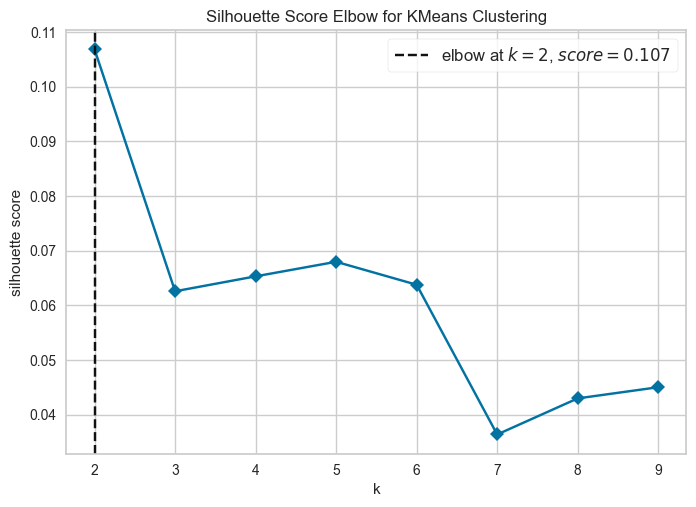

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [207]:
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=True, metric="silhouette", timings=False)

visualizer.fit(data_no_outliers.iloc[:, 1:])        # Fit the data to the visualizer
visualizer.show()       

In [208]:
n_clusters = 3

In [209]:
km = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=100, random_state=42)
clusters_predict = km.fit_predict(data_no_outliers.iloc[:, 1:])
print(km.inertia_)

20460264.0


In [210]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(data_no_outliers.iloc[:, 1:],clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(data_no_outliers.iloc[:, 1:],clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(data_no_outliers.iloc[:, 1:],clusters_predict)}")

Davies bouldin score: 3.52053657889615
Calinski Score: 2175.554682743223
Silhouette Score: 0.06020030751824379


In [211]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["component-1", "component-2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["component-1", "component-2", "component-3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()

    fig = px.scatter_3d(df, 
                        x=columns[0], 
                        y=columns[1], 
                        z=columns[2],
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'component-3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()


    fig = px.scatter(df, 
                        x=columns[0], 
                        y=columns[1],
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


In [212]:
data_no_outliers.describe()

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
count,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,...,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000,36731.000000
mean,0.051057,-0.125532,0.016713,0.008853,-0.015738,-0.103928,0.021649,-0.093610,0.107776,-0.055801,...,0.089687,-0.165116,-0.041649,0.076198,-0.097325,-0.045949,-0.055066,0.017960,0.124794,0.001693
std,0.958565,0.924510,0.917523,0.944954,0.959988,0.866190,0.950567,0.925287,0.887112,0.891716,...,0.942068,0.756940,0.970207,0.865637,0.879146,0.928920,0.906282,0.936609,0.900981,0.966094
min,-4.796554,-3.993687,-3.783025,-4.713825,-3.985901,-4.441320,-4.383927,-3.282105,-4.061334,-3.982179,...,-3.980707,-3.217929,-3.990167,-4.381142,-4.031082,-4.194991,-4.006019,-4.731512,-4.337724,-4.640702
25%,-0.475044,-0.738924,-0.499677,-0.568063,-0.615173,-0.653171,-0.625417,-0.751338,-0.455591,-0.632007,...,-0.562210,-0.637682,-0.699811,-0.453009,-0.660785,-0.664553,-0.653386,-0.558451,-0.442693,-0.604113
50%,0.123182,-0.116534,0.111068,0.002333,-0.022392,-0.062580,0.043753,-0.162626,0.138810,-0.067131,...,0.113921,-0.205436,-0.084040,0.094605,-0.100018,-0.069834,-0.114117,0.017480,0.176994,0.016135
75%,0.671713,0.518381,0.637019,0.604073,0.591674,0.470234,0.682259,0.487932,0.715212,0.522037,...,0.763036,0.243832,0.571273,0.625997,0.458814,0.562158,0.449910,0.585588,0.733172,0.614166
max,3.921782,3.271403,3.402414,4.834328,5.662791,3.513526,3.649487,3.771844,3.527873,4.077305,...,3.395654,3.390195,4.249500,3.917789,4.279485,3.829517,5.098234,4.493872,3.553656,4.182658


In [213]:
pca_3d_object, df_pca_3d = get_pca_3d(data_no_outliers.iloc[:, 1:], clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=0.8, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             73.883         9.62%                      9.62%
1             43.504         5.66%                     15.28%
2             35.884         4.67%                     19.96%


In [214]:
pca_2d_object, df_pca_2d = get_pca_2d(data_no_outliers.iloc[:, 1:], clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=0.8, width_line = 0.1)

In [215]:
sampling_data = data_no_outliers.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=700, 
                  init='random', 
                  perplexity=100, 
                  n_iter = 1000).fit_transform(sampling_data.iloc[:, 1:])

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "TSNE Space", opacity=1, width_line = 0.1)

In [216]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data.iloc[:, 1:])

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "TSNE Space", opacity=1, width_line = 0.5)

In [217]:
df_tsne_3d = TSNE(
    n_components=3,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
).fit_transform(data_no_outliers.iloc[:, 1:])
df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["component-1", "component-2", "component-3"])
df_tsne_3d["cluster"] = clusters_predict
plot_pca_3d(df_tsne_3d, title = "TSNE Space", opacity=0.8, width_line = 0.1)

In [218]:
df_tsne_2d = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
).fit_transform(data_no_outliers.iloc[:, 1:])
df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["component-1", "component-2"])
df_tsne_2d["cluster"] = clusters_predict

plot_pca_2d(df_tsne_2d, title = "TSNE Space", opacity=0.8, width_line = 0.1)

In [219]:
# characterizing the clusters
customer_df["cluster"] = clusters_predict

df_group = customer_df.groupby('cluster').agg(
    {
        'customer_id': 'count',
        'customer_unique_id': 'nunique',
        'customer_city': 'nunique',
        'customer_state': 'nunique',
    }
).reset_index()

df_group.columns = ['cluster', 'count', 'unique_customers', 'unique_cities', 'unique_states']

df_group


ValueError: Length of values (36731) does not match length of index (99441)

In [ ]:
# from sentence_transformers import SentenceTransformer

# # Load the model
# model = SentenceTransformer(transformer_to_use)

# orders_with_review = orders_with_review.iloc[:10]

# for index, row in orders_with_review.iterrows():
#     # encode the review_comment_message. If review_comment_message is NaN, encode the review_comment_title
#     to_be_encoded = row['review_comment_message'] if not pd.isna(row['review_comment_message']) else row['review_comment_title']
#     # check for any emoji in the review. If there is, select all distinct emojis and encode them using emoji2vec
#     if any(char in emoji_2_vec_df[0].values for char in to_be_encoded):
#         # get all distinct emojis in the review
#         emojis = set([char for char in to_be_encoded if char in emoji_2_vec_df[0].values])
#         # encode each emoji using emoji2vec and get the resultant average of all the encoded emojis 
        

# encoded_reviews = model.encode(orders_with_review['review_comment_message'].fillna(orders_with_review['review_comment_title']).values)

# encoded_reviews_df = pd.DataFrame(encoded_reviews)
# encoded_reviews_df